In [18]:
import pandas as pd
from glob import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio,structural_similarity,normalized_root_mse,hausdorff_distance,normalized_mutual_information
import os

In [19]:
i=4
#images_list=sorted(glob("./processed_data/Nov_21/"+str(i)+"/*.png"))
images_list=sorted(glob("/home/uwr/Desktop/2023_UWR/Analysis/raw_data/26Jan/camera/11_13_03/*"))[6:]
camera_data_clean=[x.split("/")[-1].split(".")[0] for x in images_list]
camera_data_clean=[x.split("_")[0]+"."+x.split("_")[1] for x in camera_data_clean]
camera_timestamps=np.array(camera_data_clean,np.float128)

In [20]:
images_list

['/home/uwr/Desktop/2023_UWR/Analysis/raw_data/26Jan/camera/11_13_03/1706238790_11126279.png',
 '/home/uwr/Desktop/2023_UWR/Analysis/raw_data/26Jan/camera/11_13_03/1706238791_10576009.png',
 '/home/uwr/Desktop/2023_UWR/Analysis/raw_data/26Jan/camera/11_13_03/1706238792_10862112.png',
 '/home/uwr/Desktop/2023_UWR/Analysis/raw_data/26Jan/camera/11_13_03/1706238793_11811733.png',
 '/home/uwr/Desktop/2023_UWR/Analysis/raw_data/26Jan/camera/11_13_03/1706238794_9974241.png',
 '/home/uwr/Desktop/2023_UWR/Analysis/raw_data/26Jan/camera/11_13_03/1706238795_17157793.png',
 '/home/uwr/Desktop/2023_UWR/Analysis/raw_data/26Jan/camera/11_13_03/1706238796_10374546.png',
 '/home/uwr/Desktop/2023_UWR/Analysis/raw_data/26Jan/camera/11_13_03/1706238797_10585069.png',
 '/home/uwr/Desktop/2023_UWR/Analysis/raw_data/26Jan/camera/11_13_03/1706238798_15710830.png',
 '/home/uwr/Desktop/2023_UWR/Analysis/raw_data/26Jan/camera/11_13_03/1706238799_9676218.png',
 '/home/uwr/Desktop/2023_UWR/Analysis/raw_data/26Jan

In [21]:
camera_tared=camera_timestamps-camera_timestamps[0]

In [22]:
def percentage_dist(dist_val,width=1.385):
    return(1-(dist_val/width))

In [23]:
camera_tared

array([ 0.        ,  0.9944973 ,  1.99735833,  3.00685454,  4.88616131,
        5.06031514,  5.99248267,  6.9945879 ,  8.04584551,  9.85635901,
        9.99221802, 11.0278163 , 11.99287367, 13.00945568, 14.00037432,
       15.01837731, 16.01612425, 17.01435995, 18.02923966, 18.9920702 ,
       19.98940945, 21.00501395, 22.02113343, 23.02811671, 24.02045155,
       25.00484705, 26.02676487, 27.02064705, 28.01213789, 29.00361443,
       29.99089003, 31.00152111, 31.99732256], dtype=float128)

In [25]:
# Replace # ... with the actual time differences
time_diff = np.diff(camera_tared)

# Compute the average time difference
average_time_diff = np.mean(time_diff)

# Compute the frequency (inverse of the average time difference)
frequency = 1 / average_time_diff

print("Frequency:", frequency, "Hz")


Frequency: 1.0000836770031685757 Hz


In [26]:
#df=pd.read_csv(glob("./processed_data/Nov_21/"+str(i)+"/*_sync.csv")[0])
df=pd.read_csv(glob("/home/uwr/Desktop/2023_UWR/Analysis/processed_data/26Jan/KF/26Jan_2024_01_26_03_13_10_sync.csv")[0])

In [27]:
times=np.array(df["Timestamp"]-df["Timestamp"][0],np.float128)

In [28]:
times_tared=times/np.power(10,9)

In [29]:
times_tared

array([ 0.        ,  0.15971278,  0.26983306,  0.36184144,  0.52063533,
        0.63017654,  0.70212165,  0.86997894,  1.02022467,  1.09055144,
        1.24982228,  1.36287269,  1.45047644,  1.62004209,  1.72987961,
        1.81991294,  1.97998841,  2.08983617,  2.18057604,  2.3398695 ,
        2.44995204,  2.52088546,  2.71091485,  2.81168996,  2.91041604,
        3.07095779,  3.18091455,  3.27028885,  3.42996183,  3.55027159,
        3.65118476,  3.80044037,  3.9110105 ,  4.00024383,  4.16069055,
        4.28057324,  4.37019263,  4.53103387,  4.64058105,  4.73034481,
        4.91363863,  4.96071981,  5.09028887,  5.2609592 ,  5.37030646,
        5.46075083,  5.62041963,  5.73024239,  5.76096159,  5.97032363,
        6.09952627,  6.18994401,  6.59946587,  6.71927135,  6.82061605,
        6.85967105,  6.94023205,  6.94939418,  7.27940403,  7.44006896,
        7.55068496,  7.62960651,  7.77017137,  7.9103055 ,  8.00950544,
        8.17082922,  8.28029996,  8.36941735,  8.53008351,  8.65

In [30]:
lst=[]
lst2=[]#To get camera positions as well
for x in times_tared:
    lst.append(np.argmin(np.abs(camera_tared-x)))

In [31]:
lst

[0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 5,
 5,
 5,
 5,
 6,
 6,
 6,
 6,
 6,
 6,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 10,
 10,
 10,
 10,
 10,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 14,
 14,
 14,
 14,
 14,
 14,
 14,
 14,
 15,
 15,
 15,
 15,
 15,
 15,
 15,
 15,
 16,
 16,
 16,
 16,
 16,
 16,
 16,
 16,
 17,
 17,
 17,
 17,
 17,
 17,
 17,
 17,
 18,
 18,
 18,
 18,
 18,
 18,
 18,
 18,
 19,
 19,
 19,
 19,
 19,
 19,
 19,
 19,
 20,
 20,
 20,
 20,
 20,
 20,
 20,
 20,
 20,
 21,
 21,
 21,
 21,
 21,
 21,
 21,
 21,
 22,
 22,
 22,
 22,
 22,
 22,
 22,
 22,
 23,
 23,
 23,
 23,
 23,
 23,
 23,
 23,
 24,
 24,
 24,
 24,
 24,
 24,
 24,
 24,
 25,
 25,
 25,
 25,
 25,
 25,
 25,
 25,
 26,
 26,
 26,
 26,
 26,
 26,
 26,
 26,
 27,


In [32]:
z_d=df["Pose_Z"][3:]*-1
z_d=z_d.reset_index()["Pose_Z"]

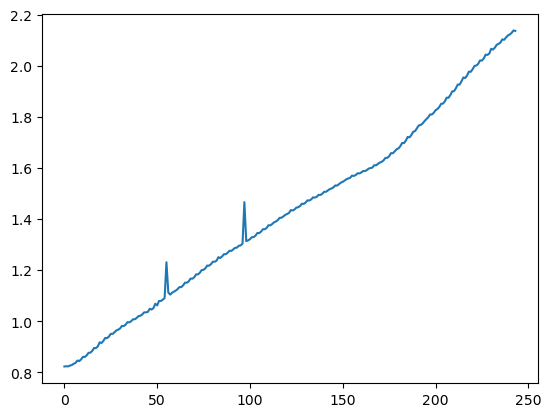

In [33]:
plt.plot(z_d)

42
55
97
179
206


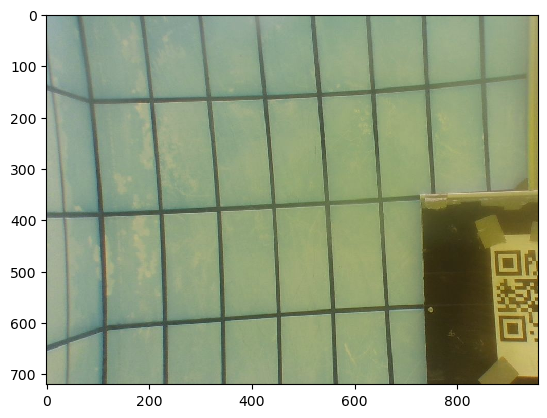

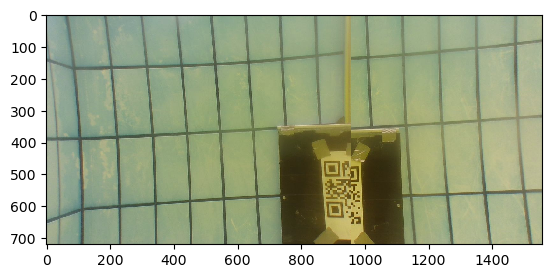

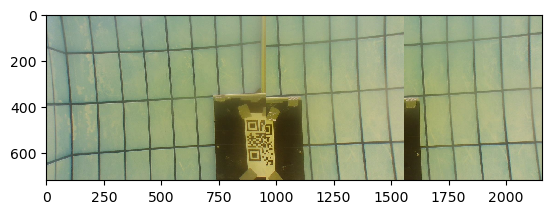

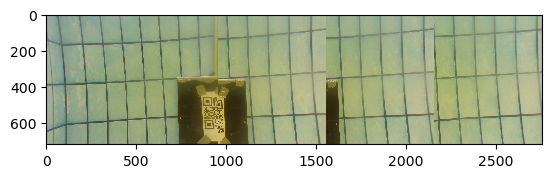

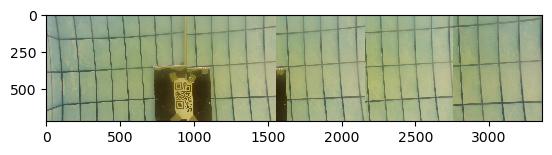

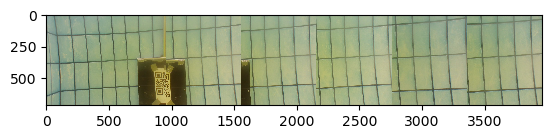

In [36]:
l2=[]
for x in range(0,len(z_d)):
    #print(z_d[x],end=" ")
    for y in range(x+1,len(z_d)):
        
        #print(z_d[y],end=" ")
        if(np.abs(z_d[y]-z_d[x])>0.2-0.001):
            #print()
            l2.append((x,y))
            break
        
compare=l2[0]
l3=[compare]
l4=[compare[0]]
for x in l2[1:]:
    if(compare[1]==x[0]):
        compare=x
        l3.append(x)
        l4.append(x[0])
#img_first=cv2.imread(images_list[lst[l4[0]]])
img_first=cv2.imread(images_list[lst[l4[0]]])[:,:int(np.round(1280*(percentage_dist(0.2*1.75))))]
plt.figure()
plt.imshow(img_first)
fixed_padding_pixels = 50  #

padding_pixels=0.05*(1280/1.385)
i=1
# Display images using indices from l4 with increasing left padding
sample=images_list[lst[l4[0]]]
for x in (l4[1:]):
    print(x)
    if(images_list[lst[x]]!=sample):
        img = cv2.imread(images_list[lst[x]])
    
    # Pad the image on the left with the current padding value
        padded_img1 = cv2.copyMakeBorder(img, 0, 0, int(padding_pixels*i),0, cv2.BORDER_CONSTANT, value=[0, 0, 0])
        padded_img2 = cv2.copyMakeBorder(img_first, 0, 0,0, int(padding_pixels*i), cv2.BORDER_CONSTANT, value=[0, 0, 0])
    #print(padded_img1.shape)
    #img_first=cv2.addWeighted(padded_img1,0.5,padded_img2,0.5,0)
        plt.figure()
        img_first=np.hstack([img_first,img[:,int(np.round(1280*(percentage_dist(0.65)))):]])
    
        plt.imshow(img_first)
        i+=1
        sample=images_list[lst[x]]
    else:
        print("discard")
    # Increase the padding for the next iteratio

plt.show()


In [37]:
def img_metrics(mosaic,ref_image,crop_min_h=0,crop_max_h=-1):
    mosaic=cv2.resize(mosaic[crop_min_h:crop_max_h,:],(ref_image.shape[1],ref_image.shape[0]))
    ssim=structural_similarity(ref_image,mosaic,channel_axis=2,gaussian_weights=True,data_range=255)
    psnr=peak_signal_noise_ratio(ref_image,mosaic)
    nrmse=normalized_root_mse(ref_image,mosaic)
    hd=hausdorff_distance(ref_image,mosaic)
    nmi=normalized_mutual_information(ref_image,mosaic)
    return ssim,psnr,hd,nrmse,nmi

In [38]:

def image_mosaic(min_dist,percentage):
    l2=[]
    for x in range(0,len(z_d)):
        for y in range(x+1,len(z_d)):
            if(np.abs(z_d[y]-z_d[x])>min_dist-0.001):
                l2.append((x,y))
                break
    compare=l2[0]
    l3=[compare]
    l4=[compare[0]]
    for x in l2[1:]:
        if(compare[1]==x[0]):
            compare=x
            l3.append(x)
            l4.append(x[0])
            #l4.append(x[1])
    #print(len(images_list))
    img=cv2.imread(images_list[0])
    img_first=img[:,:int(640*percentage)]
    #plt.figure()
    #plt.imshow(img_first)
    for x in l4[1:len(l4)]:
        #print(images_list[lst[x]])
        img=cv2.imread(images_list[lst[x]])
        img=img[:,int(640*(percentage)):]
        #plt.figure()
        img_first=np.hstack([img_first,img])
        #plt.imshow(img_first)
    return img_first
        
#img_last=cv2.imread(images_list[-1])
#img_last=cv2.imread(images_list[-1])
#plt.imshow(img_last[:,640//4:])   
#img_first=np.hstack(img_first,img_last) 

In [39]:
def image_mosaic_v2(min_dist,percentage,alpha=0.3):
    l2=[]
    for x in range(0,len(z_d)):
        for y in range(x+1,len(z_d)):
            if(np.abs(z_d[y]-z_d[x])>min_dist-0.001):
                l2.append((x,y))
                break
    compare=l2[0]
    l3=[compare]
    l4=[compare[0]]
    for x in l2[1:]:
        if(compare[1]==x[0]):
            compare=x
            l3.append(x)
            l4.append(x[0])
            #l4.append(x[1])
    print(l4)
    img=cv2.imread(images_list[lst[l4[0]]])
    #img_first=img[:,:int(640*percentage)]
    img_first=img[:,:]
    #plt.figure()
    #plt.imshow(img_first)
    sample=images_list[lst[l4[0]]]
    for x in l4[1:len(l4)]:
        #print(images_list[lst[x]])
        if(sample!=images_list[lst[x]]):
            img=cv2.imread(images_list[lst[x]])
            #print(img.shape)
            img_left=img[:,:int(np.round(1280*(percentage)))]
            #plt.figure()
            #plt.imshow(img_left)
            #plt.close()
            img_right=img[:,int(np.round(1280*(percentage))):]
            
            img_first=np.hstack([img_first,img_right])
            
            img_overlap_1=img_first[:,img_first.shape[1]-1280:img_first.shape[1]-int(np.round(1280*(1-percentage)))]
            print(img_right.shape)
            print(img_overlap_1.shape)
            #print(img_left.shape)
            img_overlap_2=cv2.addWeighted(img_left,alpha,img_overlap_1,1-alpha,1)
            img_first[:,img_first.shape[1]-1280:img_first.shape[1]-int(np.round(1280*(1-percentage)))]=img_overlap_2
        else:
            print("discard")
        #img_overlap_2=img_overlap_1[:,int(np.round(640*(1-percentage))):640]
        #img_overlap_1[:,int(np.round(640*(1-percentage))):640]=cv2.resize(img_left,(img_overlap_2.shape[1],img_overlap_2.shape[0]))
        #img_first=cv2.addWeighted(img_overlap_1,0.5,img_stack,0.5,1)
        #plt.imshow(img)
    return img_first

In [40]:
def image_mosaic_v3(min_dist,alpha1,alpha2):
    l2=[]
    for x in range(0,len(z_d)):
        for y in range(x+1,len(z_d)):
            if(np.abs(z_d[y]-z_d[x])>min_dist-0.001):
                l2.append((x,y))
                break
    compare=l2[0]
    l3=[compare]
    l4=[compare[0]]
    for x in l2[1:]:
        if(compare[1]==x[0]):
            compare=x
            l3.append(x)
            l4.append(x[0])
            #l4.append(x[1])
    print(l4)
    img=cv2.imread(images_list[0])
    #img_first=img[:,:int(640*percentage)]
    img_first=img[:,:int(np.round(1280*(percentage_dist(min_dist*alpha1))))]
    #plt.figure()
    #plt.imshow(img_first)
    for x in l4[1:len(l4)]:
        #print(images_list[lst[x]])
        img=cv2.imread(images_list[lst[x]])
        #print(img.shape)
        img_left=img[:,:int(np.round(1280*(percentage_dist(min_dist*alpha1*alpha2))))]
        #plt.figure()
        #plt.imshow(img_left)
        #plt.close()
        img_right=img[:,int(np.round(1280*(percentage_dist(min_dist*alpha1*alpha2)))):]
        
        img_first=np.hstack([img_first,img_right])
        
        #img_overlap_1=img_first[:,img_first.shape[1]-1280:img_first.shape[1]-int(np.round(1280*(1-percentage)))]
        print(img_right.shape)
        #print(img_overlap_1.shape)
        #print(img_left.shape)
        #img_overlap_2=cv2.addWeighted(img_left,alpha,img_overlap_1,1-alpha,1)
        #img_first[:,img_first.shape[1]-1280:img_first.shape[1]-int(np.round(1280*(1-percentage)))]=img_overlap_2
        #img_overlap_2=img_overlap_1[:,int(np.round(640*(1-percentage))):640]
        #img_overlap_1[:,int(np.round(640*(1-percentage))):640]=cv2.resize(img_left,(img_overlap_2.shape[1],img_overlap_2.shape[0]))
        #img_first=cv2.addWeighted(img_overlap_1,0.5,img_stack,0.5,1)
        #plt.imshow(img)
    return img_first

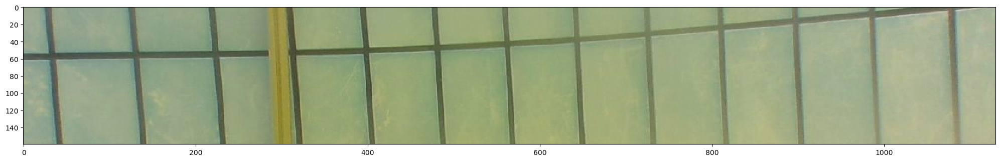

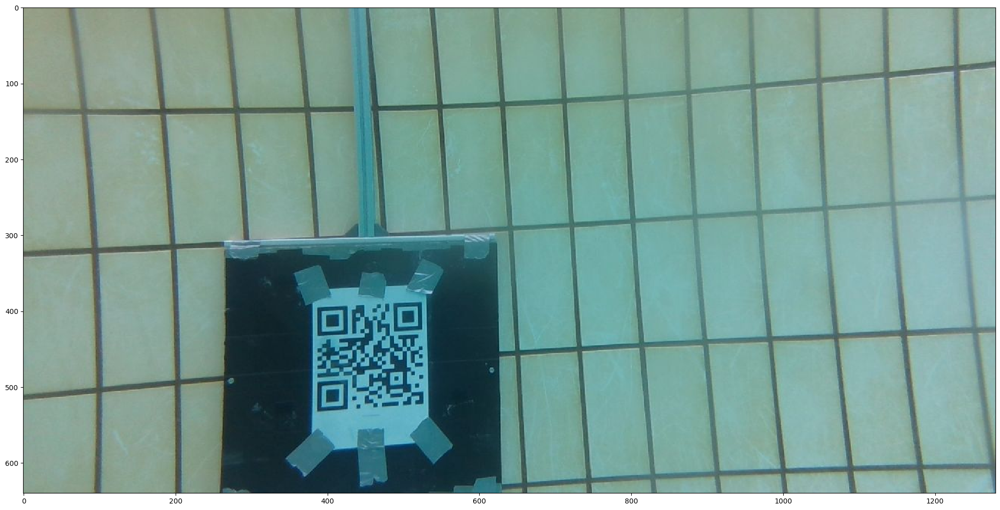

In [107]:
ref_image=cv2.imread("/home/uwr/Desktop/ref_image.png")
plt.figure(figsize=(25,15))
plt.imshow(ref_image[160:320,150:])
plt.figure(figsize=(25,15))
#image = cv2.flip(ref_image[180:320,150:], 0) 
image=cv2.cvtColor(ref_image[80:,:],cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.imsave("/home/uwr/Desktop/ref_image_cropped.png",image)

[0, 21, 42, 55, 56, 77, 97, 98, 119, 143, 170, 185, 200, 212, 226]
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
[0, 36, 55, 97, 175, 200]
(720, 162, 3)
(720, 1118, 3)
(720, 162, 3)
(720, 1118, 3)
(720, 162, 3)
(720, 1118, 3)
(720, 162, 3)
(720, 1118, 3)
(720, 162, 3)
(720, 1118, 3)
[0, 51, 97, 185]
(720, 231, 3)
(720, 1049, 3)
(720, 231, 3)
(720, 1049, 3)
(720, 231, 3)
(720, 1049, 3)
[0, 55, 152]
(720, 300, 3)
(720, 980, 3)
(720, 300, 3)
(720, 980, 3)
[0, 55, 173]
(720, 370, 3)
(720, 910, 3)
(720, 370, 3)
(720, 910, 3)


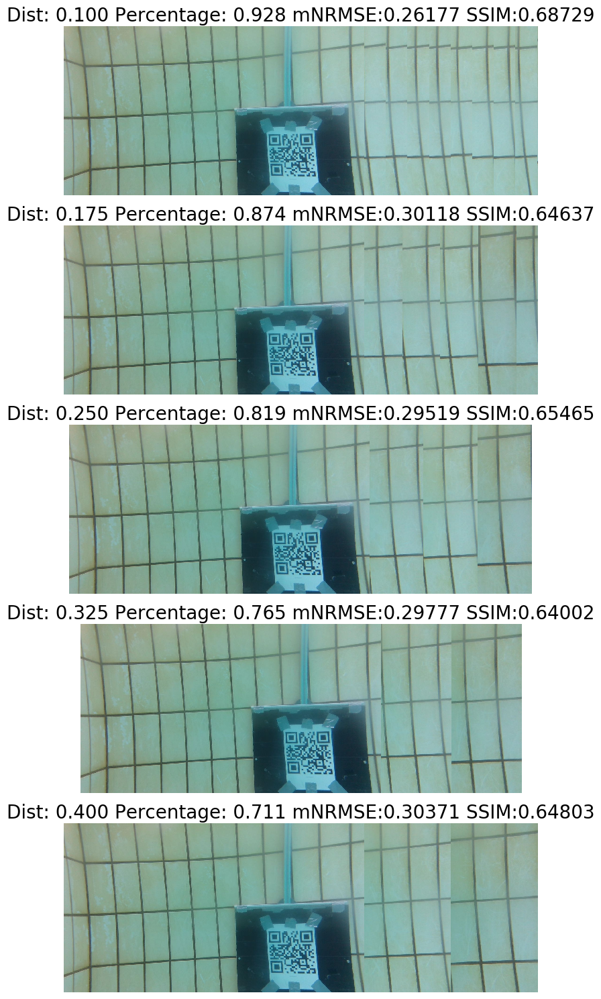

In [118]:
j=6
#percentage_list=np.linspace(0.1,0.3,3)
#percentage_list
#distance_list=np.linspace(0.1,0.4,9)
distance_list=[0.1,0.175,0.25,0.325,0.4]
os.makedirs("/home/uwr/Desktop/"+str(j)+"results_data/",exist_ok=True)
cv2.imwrite("/home/uwr/Desktop/"+str(j)+"_data/ref_image.png",image)
psnr_list=[]
ssim_list=[]
nrmse_list=[]
hd_list=[]
nmi_list=[]
img_list=[]
percentage_list=[]
#for percentage in percentage_list:
for distance in distance_list:
    percentage=percentage_dist(distance)
    #print(distance,percentage)
    mosaic=image_mosaic_v2(min_dist=distance,percentage=percentage,alpha=0)
    ssim,psnr,hd,nrmse,nmi=img_metrics(image,cv2.cvtColor(mosaic,cv2.COLOR_BGR2RGB))
    psnr_list.append(psnr)
    ssim_list.append(ssim)
    hd_list.append(hd)
    nrmse_list.append(nrmse)
    nmi_list.append(nmi)
    img_list.append(mosaic)
    percentage_list.append(percentage)
    #print(distance,percentage,nrmse)
    cv2.imwrite("/home/uwr/Desktop/"+str(j)+"results_data/"+str((1-percentage)*100)+"%"+str(distance)+"m_image.png",mosaic[100:400,:])
#print(nrmse_list)
num_images = len(img_list)
rows = int(np.ceil(num_images))  # Assuming you want 3 images per row

fig, axs = plt.subplots(rows,1, figsize=(12, 3*rows))

for index in range(len(img_list)):
    for index in range(len(img_list)):
        axs[index].imshow(cv2.cvtColor(img_list[index][:,:img_list[-1].shape[1]],cv2.COLOR_BGR2RGB))
        axs[index].set_title(f"Dist: {distance_list[index]:.3f} Percentage: {percentage_list[index]:.3f} mNRMSE:{nrmse_list[index]:.5f} SSIM:{ssim_list[index]:.5f}",fontsize=20)
    
        axs[index].axis("off")
            
        

plt.subplots_adjust(wspace=0.0001, hspace=0.1)
plt.tight_layout()
plt.show()


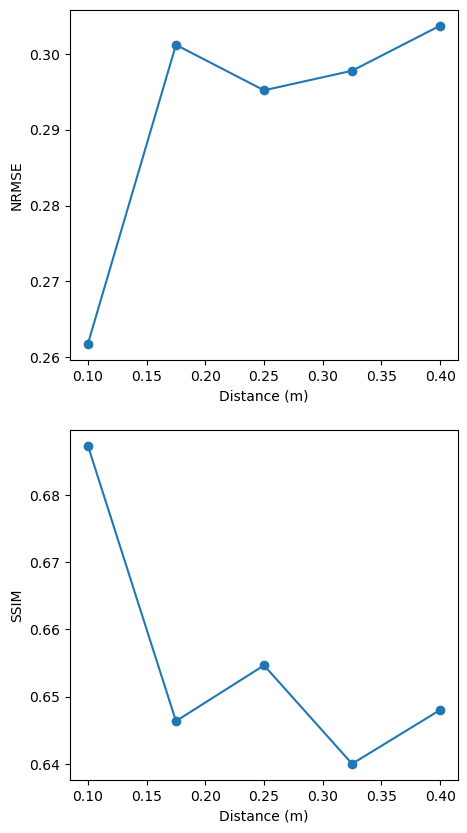

In [109]:
fig, axs = plt.subplots(2,1, figsize=(5, 10))

# Subplot 1
axs[0].set_xlabel("Distance (m)")
axs[0].set_ylabel("NRMSE")
#for x in range(0, len(nrmse_list), 3):
axs[0].plot(distance_list, nrmse_list, "-o")
#axs[0].legend(np.round((percentage_list) * 100))
#axs[0].set_ylim([0.33,0.38])
axs[1].set_ylabel("SSIM")

axs[1].set_xlabel("Distance (m)")

#for x in range(0, len(nrmse_list), 3):
axs[1].plot(distance_list, ssim_list, "-o")
#axs[1].legend(np.round((percentage_list) * 100))
#axs[1].set_ylim([0.6,0.7])

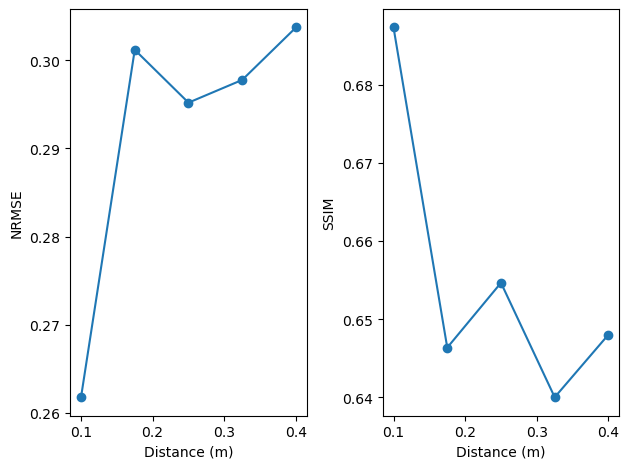

In [110]:
fig, axs = plt.subplots(1,2)

# Subplot 1
axs[0].set_xlabel("Distance (m)")
axs[0].set_ylabel("NRMSE")
#for x in range(0, len(nrmse_list), 3):
axs[0].plot(distance_list, nrmse_list, "-o")
#axs[0].legend(np.round((percentage_list) * 100))
#axs[0].set_ylim([0.33,0.38])
axs[1].set_ylabel("SSIM")

axs[1].set_xlabel("Distance (m)")

#for x in range(0, len(nrmse_list), 3):
axs[1].plot(distance_list, ssim_list, "-o")
#axs[1].legend(np.round((percentage_list) * 100))
#axs[1].set_ylim([0.6,0.7])
plt.tight_layout()

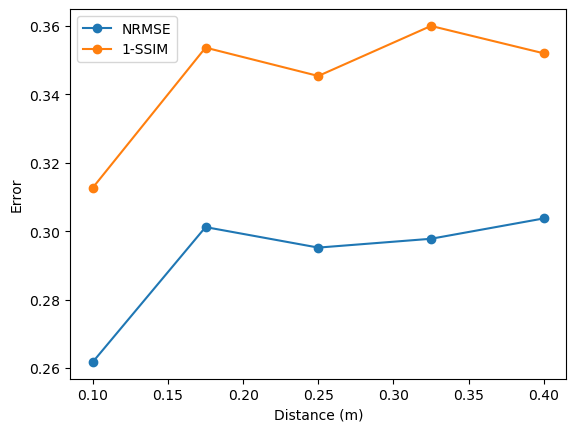

In [111]:
plt.xlabel("Distance (m)")
plt.ylabel("Error")
#for x in range(0, len(nrmse_list), 3):
plt.plot(distance_list, np.array(nrmse_list),"-o")
plt.plot(distance_list,1- np.array(ssim_list),"-o")
plt.legend(["NRMSE","1-SSIM"])
#axs[0].legend(np.round((percentage_list) * 100))
#axs[0].set_ylim([0.33,0.38])
#axs[1].legend(np.round((percentage_list) * 100))
#axs[1].set_ylim([0.6,0.7])

[0, 21, 42, 55, 56, 77, 97, 98, 119, 143, 170, 185, 200, 212, 226]
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
[0, 21, 42, 55, 56, 77, 97, 98, 119, 143, 170, 185, 200, 212, 226]
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
(720, 92, 3)
(720, 1188, 3)
[0, 21, 42, 55, 56, 77, 97, 98, 119, 143, 170, 185, 200, 212, 226]
(720, 92, 3)
(7

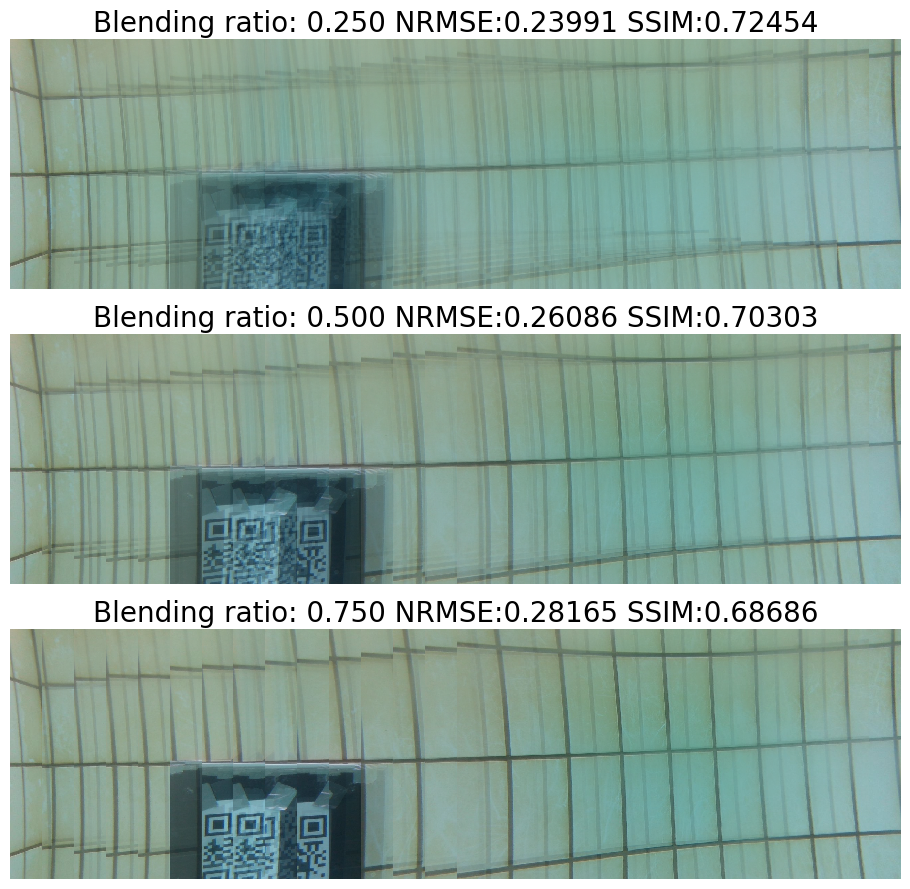

In [120]:
j=6
#percentage_list=np.linspace(0.1,0.3,3)
#percentage_list
alpha_list=[0.25,0.5,0.75]
os.makedirs("/home/uwr/Desktop/"+str(j)+"results_data/",exist_ok=True)
cv2.imwrite("/home/uwr/Desktop/"+str(j)+"_data/ref_image.png",image)
psnr_list=[]
ssim_list=[]
nrmse_list=[]
hd_list=[]
nmi_list=[]
img_list=[]
percentage_list=[]
#for percentage in percentage_list:
for alpha in alpha_list:
    percentage=percentage_dist(0.1)
    #print(distance,percentage)
    mosaic=image_mosaic_v2(min_dist=0.1,percentage=percentage,alpha=alpha)
    ssim,psnr,hd,nrmse,nmi=img_metrics(image,cv2.cvtColor(mosaic,cv2.COLOR_BGR2RGB))
    psnr_list.append(psnr)
    ssim_list.append(ssim)
    hd_list.append(hd)
    nrmse_list.append(nrmse)
    nmi_list.append(nmi)
    img_list.append(mosaic)
    percentage_list.append(percentage)
    #print(distance,percentage,nrmse)
    #cv2.imwrite("/home/uwr/Desktop/"+str(j)+"results_data/"+str((1-percentage)*100)+"%"+str(distance)+"m_image.png",mosaic[100:400,:])
#print(nrmse_list)
num_images = len(img_list)
rows = int(np.ceil(num_images))  # Assuming you want 3 images per row

fig, axs = plt.subplots(rows,1, figsize=(12, 3*rows))

for index in range(len(img_list)):
    for index in range(len(img_list)):
        axs[index].imshow(cv2.cvtColor(img_list[index],cv2.COLOR_BGR2RGB))
        axs[index].set_title(f"Blending ratio: {alpha_list[index]:.3f} NRMSE:{nrmse_list[index]:.5f} SSIM:{ssim_list[index]:.5f}",fontsize=20)
    
        axs[index].axis("off")
            
        

plt.subplots_adjust(wspace=0.0001, hspace=0.1)
plt.tight_layout()
plt.show()


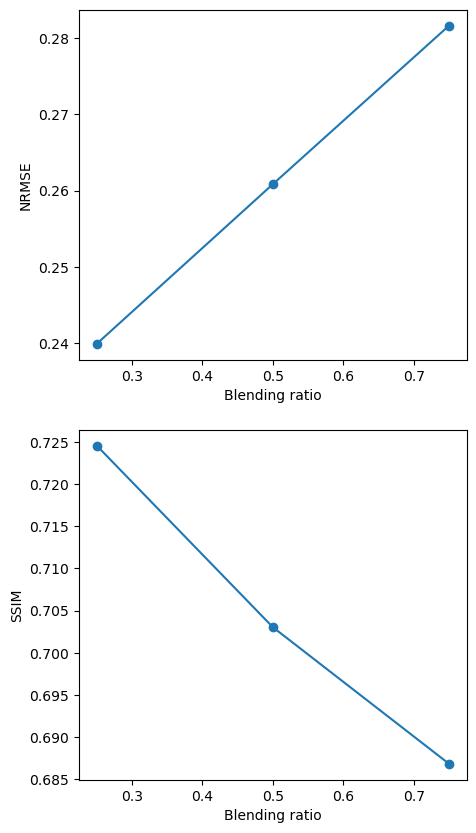

In [121]:
fig, axs = plt.subplots(2,1, figsize=(5, 10))

# Subplot 1
axs[0].set_xlabel("Blending ratio")
axs[0].set_ylabel("NRMSE")
#for x in range(0, len(nrmse_list), 3):
axs[0].plot(alpha_list, nrmse_list, "-o")
#axs[0].legend(np.round((percentage_list) * 100))
#axs[0].set_ylim([0.33,0.38])
axs[1].set_ylabel("SSIM")

axs[1].set_xlabel("Blending ratio")

#for x in range(0, len(nrmse_list), 3):
axs[1].plot(alpha_list, ssim_list, "-o")
#axs[1].legend(np.round((percentage_list) * 100))
#axs[1].set_ylim([0.6,0.7])

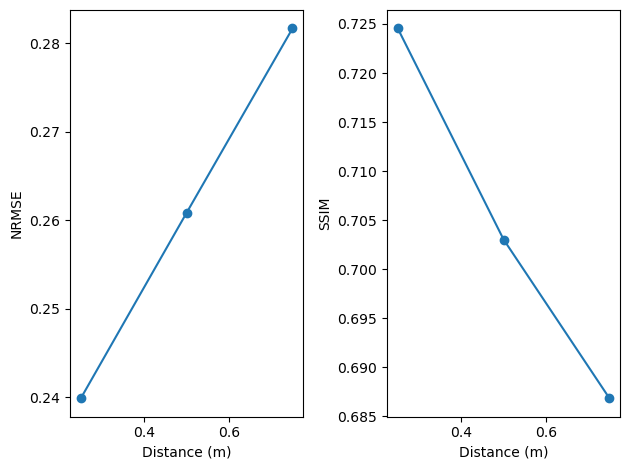

In [122]:
fig, axs = plt.subplots(1,2)

# Subplot 1
axs[0].set_xlabel("Distance (m)")
axs[0].set_ylabel("NRMSE")
#for x in range(0, len(nrmse_list), 3):
axs[0].plot(alpha_list, nrmse_list, "-o")
#axs[0].legend(np.round((percentage_list) * 100))
#axs[0].set_ylim([0.33,0.38])
axs[1].set_ylabel("SSIM")

axs[1].set_xlabel("Distance (m)")

#for x in range(0, len(nrmse_list), 3):
axs[1].plot(alpha_list, ssim_list, "-o")
#axs[1].legend(np.round((percentage_list) * 100))
#axs[1].set_ylim([0.6,0.7])
plt.tight_layout()

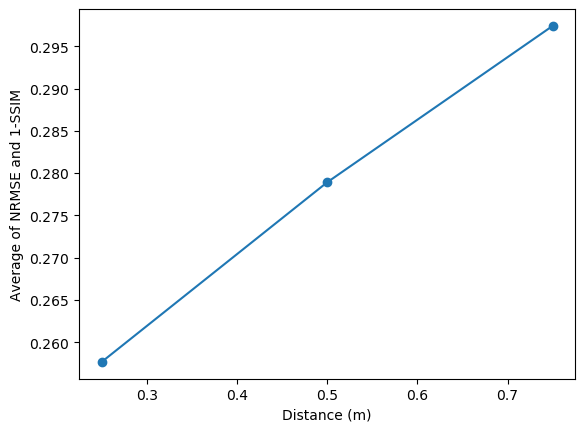

In [123]:
plt.xlabel("Distance (m)")
plt.ylabel("Average of NRMSE and 1-SSIM")
#for x in range(0, len(nrmse_list), 3):
plt.plot(alpha_list, 0.5*np.array(nrmse_list)+0.5*(1-np.array(ssim_list)),"-o")
#axs[0].legend(np.round((percentage_list) * 100))
#axs[0].set_ylim([0.33,0.38])
#axs[1].legend(np.round((percentage_list) * 100))
#axs[1].set_ylim([0.6,0.7])

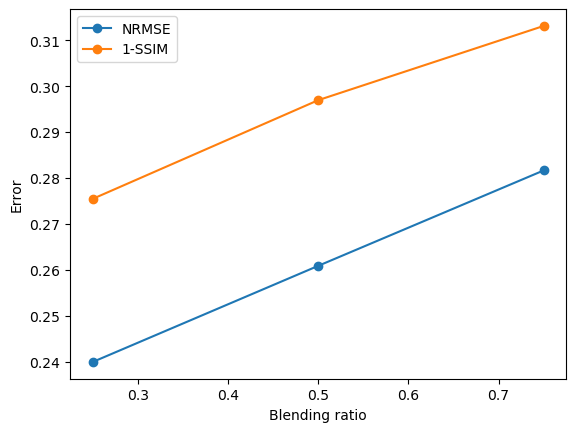

In [124]:
plt.xlabel("Blending ratio")
plt.ylabel("Error")
#for x in range(0, len(nrmse_list), 3):
plt.plot(alpha_list, np.array(nrmse_list),"-o")
plt.plot(alpha_list,1- np.array(ssim_list),"-o")
plt.legend(["NRMSE","1-SSIM"])
#axs[0].legend(np.round((percentage_list) * 100))
#axs[0].set_ylim([0.33,0.38])
#axs[1].legend(np.round((percentage_list) * 100))
#axs[1].set_ylim([0.6,0.7])

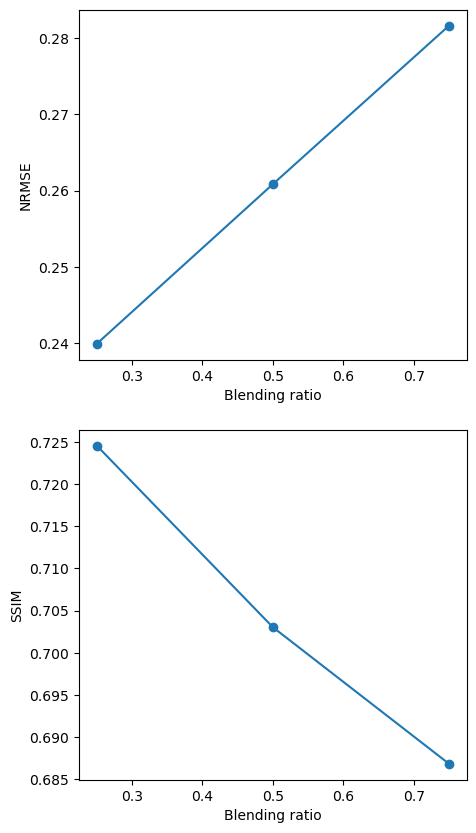

In [117]:
fig, axs = plt.subplots(2,1, figsize=(5, 10))

# Subplot 1
axs[0].set_xlabel("Blending ratio")
axs[0].set_ylabel("NRMSE")
#for x in range(0, len(nrmse_list), 3):
axs[0].plot(alpha_list, nrmse_list, "-o")
#axs[0].legend(np.round((percentage_list) * 100))
#axs[0].set_ylim([0.33,0.38])
axs[1].set_ylabel("SSIM")

axs[1].set_xlabel("Blending ratio")

#for x in range(0, len(nrmse_list), 3):
axs[1].plot(alpha_list, ssim_list, "-o")
#axs[1].legend(np.round((percentage_list) * 100))
#axs[1].set_ylim([0.6,0.7])

In [ ]:

plt.plot(distance_list)

[0, 18, 41, 48, 49, 70, 90, 91, 112, 136, 163, 178, 193, 205, 219]
[0, 18, 41, 48, 49, 70, 90, 91, 112, 136, 163, 178, 193, 205, 219]
[0, 18, 41, 48, 49, 70, 90, 91, 112, 136, 163, 178, 193, 205, 219]
[0, 48, 127, 181]
[0, 48, 127, 181]
[0, 48, 127, 181]
[0, 76, 169]
[0, 76, 169]
[0, 76, 169]


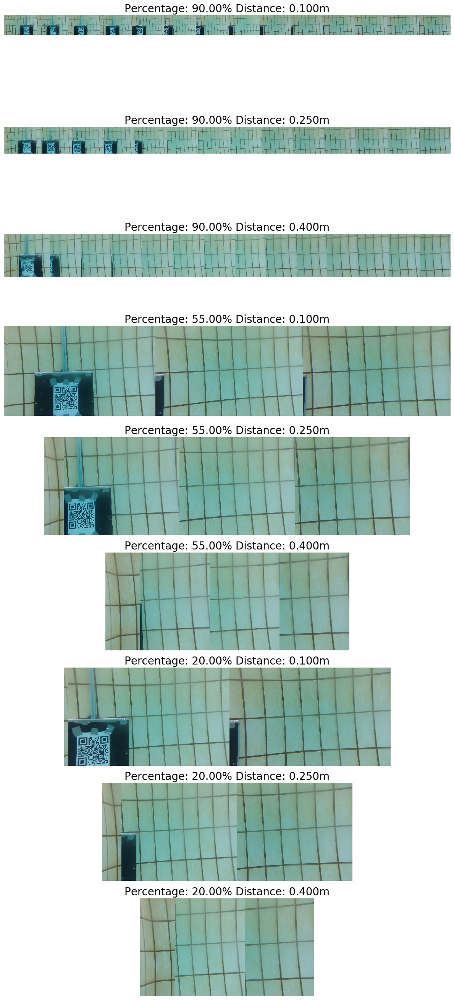

In [321]:
j=6
percentage_list=np.linspace(0.1,0.8,3)
#percentage_list
distance_list=np.linspace(0.1,0.4,3)
os.makedirs("/home/uwr/Desktop/"+str(j)+"results_data/",exist_ok=True)
cv2.imwrite("/home/uwr/Desktop/"+str(j)+"_data/ref_image.png",image)
psnr_list=[]
ssim_list=[]
nrmse_list=[]
hd_list=[]
nmi_list=[]
img_list=[]
#percentage_list=[]
#for percentage in percentage_list:
for distance in distance_list:
    for percentage in percentage_list:
    #percentage=percentage_dist(distance)
    #print(distance,percentage)
        mosaic=image_mosaic_v3(min_dist=distance,percentage=percentage,alpha=0.75)
        ssim,psnr,hd,nrmse,nmi=img_metrics(mosaic,image)
        psnr_list.append(psnr)
        ssim_list.append(ssim)
        hd_list.append(hd)
        nrmse_list.append(nrmse)
        nmi_list.append(nmi)
        img_list.append(mosaic)
        #print(percentage)
        #percentage_list.append(percentage)
    #print(distance,percentage,nrmse)
    cv2.imwrite("/home/uwr/Desktop/"+str(j)+"results_data/"+str((1-percentage)*100)+"%"+str(distance)+"m_image.png",mosaic[100:400,:])
#print(nrmse_list)
num_images = len(img_list)
rows = int(np.ceil(num_images))  # Assuming you want 3 images per row

fig, axs = plt.subplots(rows,1, figsize=(12, rows*3 ))

for i in range(rows):
    for j in range(3):
        index = i * 3 + j
        #print(j)
        if index < num_images:
            axs[index].imshow(cv2.cvtColor(img_list[index],cv2.COLOR_BGR2RGB))
            axs[index].set_title(f"Percentage: {(1-percentage_list[i])*100:.2f}% Distance: {distance_list[j]:.3f}m",fontsize=20)
            
            axs[index].axis("off")

plt.subplots_adjust(wspace=0.0001, hspace=0.1)
plt.tight_layout()
plt.show()


# Display results separately

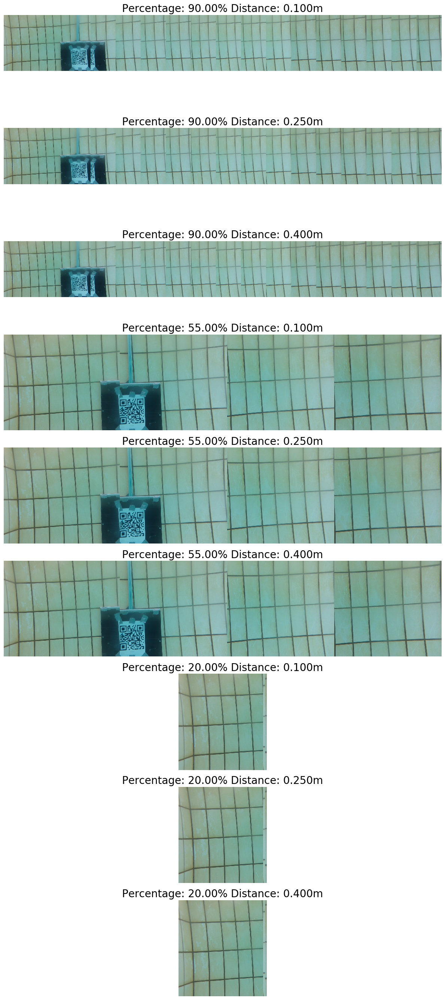

In [318]:
num_images = len(img_list)
rows = int(np.ceil(num_images))  # Assuming you want 3 images per row

fig, axs = plt.subplots(rows,1, figsize=(12, rows*3 ))

for i in range(rows):
    for j in range(3):
        index = i * 3 + j
        #print(j)
        if index < num_images:
            axs[index].imshow(cv2.cvtColor(img_list[index],cv2.COLOR_BGR2RGB))
            axs[index].set_title(f"Percentage: {(1-percentage_list[i])*100:.2f}% Distance: {distance_list[j]:.3f}m",fontsize=20)
            
            axs[index].axis("off")

plt.subplots_adjust(wspace=0.0001, hspace=0.1)
plt.tight_layout()
plt.show()

In [126]:
cv2.imwrite("/home/abubakr/Desktop/"+str(j)+"results_data/best_image.png",img_list[(np.argmin(np.array(nrmse_list)))])
cv2.imwrite("/home/abubakr/Desktop/"+str(j)+"results_data/best_image_cropped.png",img_list[(np.argmin(np.array(nrmse_list)))][100:400,:])

True

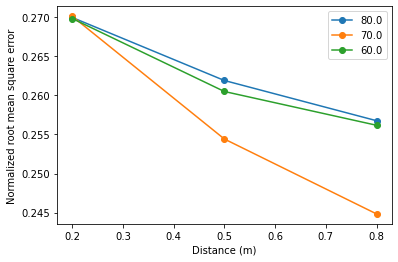

In [209]:
#plt.figure(figsize=(15,15))
plt.xlabel("Distance (m)")
plt.ylabel("Normalized root mean square error")
for x in range(0,len(nrmse_list),3):
    plt.plot(distance_list,nrmse_list[x:x+3],"-o")
plt.legend((1-percentage_list)*100)

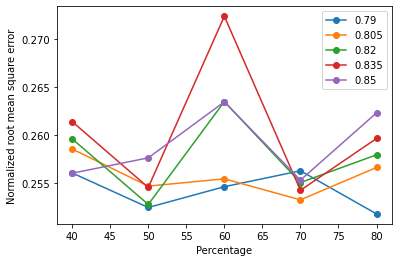

In [104]:
#plt.figure(figsize=(15,15))
plt.xlabel("Percentage")
plt.ylabel("Normalized root mean square error")
for x in range(0,5):
    sample_list=np.array([0,5,10,15,20])+x
    final_list=[nrmse_list[y] for y in sample_list]
    plt.plot((1-percentage_list)*100,final_list,"-o")
plt.legend(np.round(distance_list, decimals=3))

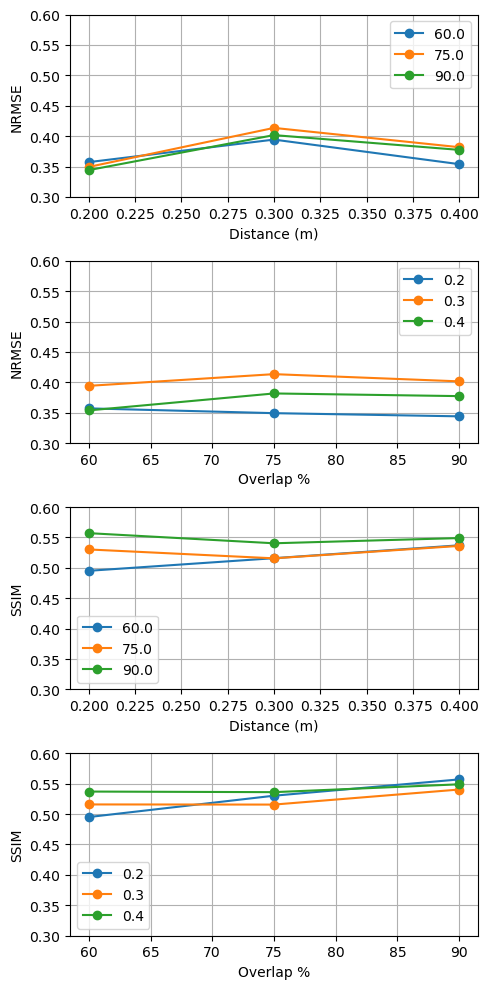

In [157]:
fig, axs = plt.subplots(4,1, figsize=(5, 10), sharey=True)

# Subplot 1
axs[0].set_xlabel("Distance (m)")
axs[0].set_ylabel("NRMSE")
for x in range(0, len(nrmse_list), 3):
    axs[0].plot(distance_list, nrmse_list[x:x+3], "-o")
axs[0].legend(np.round((percentage_list) * 100))

axs[1].set_ylabel("NRMSE")
axs[1].set_xlabel("Overlap %")
#axs[1].set_ylabel("Normalized root mean square error")
for x in range(0, 3):
    sample_list = np.array([0, 3, 6]) + x
    final_list = [nrmse_list[y] for y in sample_list]
    axs[1].plot((percentage_list) * 100, final_list, "-o")
axs[1].legend(np.round(distance_list, decimals=3))

axs[2].set_ylabel("SSIM")

axs[2].set_xlabel("Distance (m)")

for x in range(0, len(nrmse_list), 3):
    axs[2].plot(distance_list, ssim_list[x:x+3], "-o")
axs[2].legend(np.round((percentage_list) * 100))
axs[2].set_ylim([0.3,0.6])
# Subplot 2

axs[3].set_ylabel("SSIM")

axs[3].set_xlabel("Overlap %")
#axs[1].set_ylabel("Normalized root mean square error")
for x in range(0, 3):
    sample_list = np.array([0, 3, 6]) + x
    final_list = [ssim_list[y] for y in sample_list]
    axs[3].plot((percentage_list) * 100, final_list, "-o")
axs[3].legend(np.round(distance_list, decimals=3))

# Adjust layout for better spacing
plt.tight_layout()
axs[0].grid()
axs[1].grid()
axs[2].grid()
axs[3].grid()
# Show the plot
plt.show()

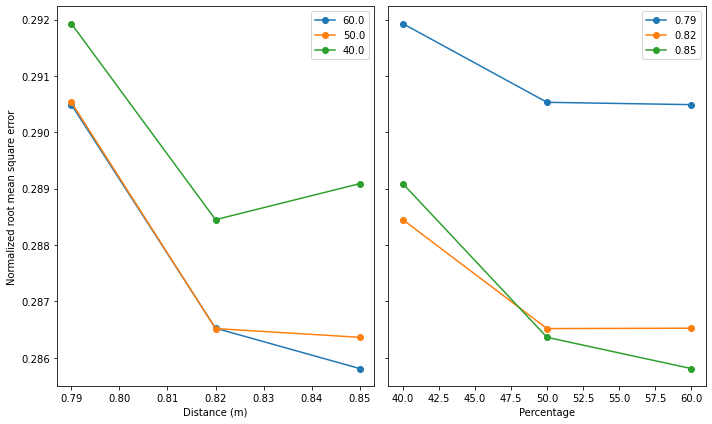

In [112]:
fig, axs = plt.subplots(1, 2, figsize=(10, 6), sharey=True)

# Subplot 1
axs[0].set_xlabel("Distance (m)")
axs[0].set_ylabel("Normalized root mean square error")
for x in range(0, len(nrmse_list), 3):
    axs[0].plot(distance_list, nrmse_list[x:x+3], "-o")
axs[0].legend((1 - percentage_list) * 100)

# Subplot 2
axs[1].set_xlabel("Percentage")
#axs[1].set_ylabel("Normalized root mean square error")
for x in range(0, 3):
    sample_list = np.array([0, 3, 6]) + x
    final_list = [nrmse_list[y] for y in sample_list]
    axs[1].plot((1 - percentage_list) * 100, final_list, "-o")
axs[1].legend(np.round(distance_list, decimals=3))

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()

p

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10, 6), sharey=True)

# Subplot 1
axs[0].set_xlabel("Distance (m)")
axs[0].set_ylabel("Normalized root mean square error")
for x in range(0, len(nrmse_list), 3):
    axs[0].plot(distance_list, nrmse_list[x:x+3], "-o")
axs[0].legend((1 - percentage_list) * 100)

# Subplot 2
axs[1].set_xlabel("Percentage")
#axs[1].set_ylabel("Normalized root mean square error")
for x in range(0, 3):
    sample_list = np.array([0, 3, 6]) + x
    final_list = [nrmse_list[y] for y in sample_list]
    axs[1].plot((1 - percentage_list) * 100, final_list, "-o")
axs[1].legend(np.round(distance_list, decimals=3))

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()

In [172]:
print(percentage_list)
print(distance_list)
print(nrmse_list)

[0.4 0.5 0.6]
[0.79 0.82 0.85]
[0.2546503412760817, 0.26350633391943323, 0.26347890564839793, 0.252488505184615, 0.25280311777609477, 0.25765507650099057, 0.2560836103935731, 0.25962894592894087, 0.25605361661772597]


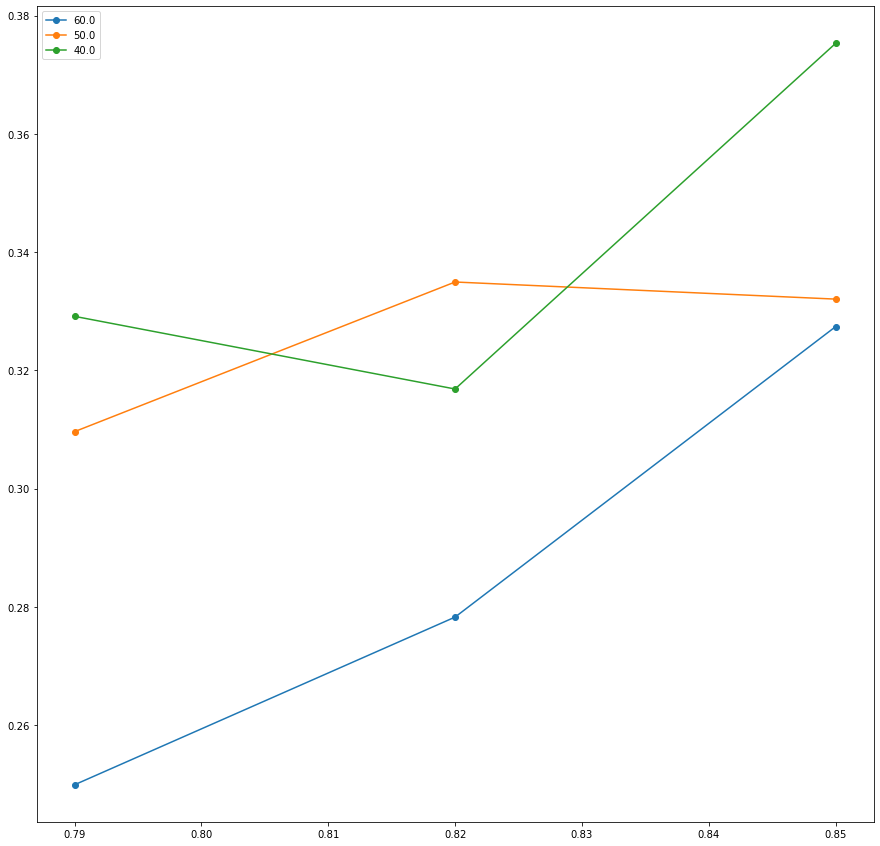

In [119]:
plt.figure(figsize=(15,15))
for x in range(0,len(ssim_list),3):
    
    plt.plot(distance_list,ssim_list[x:x+3],"-o")

plt.legend((1-percentage_list)*100)

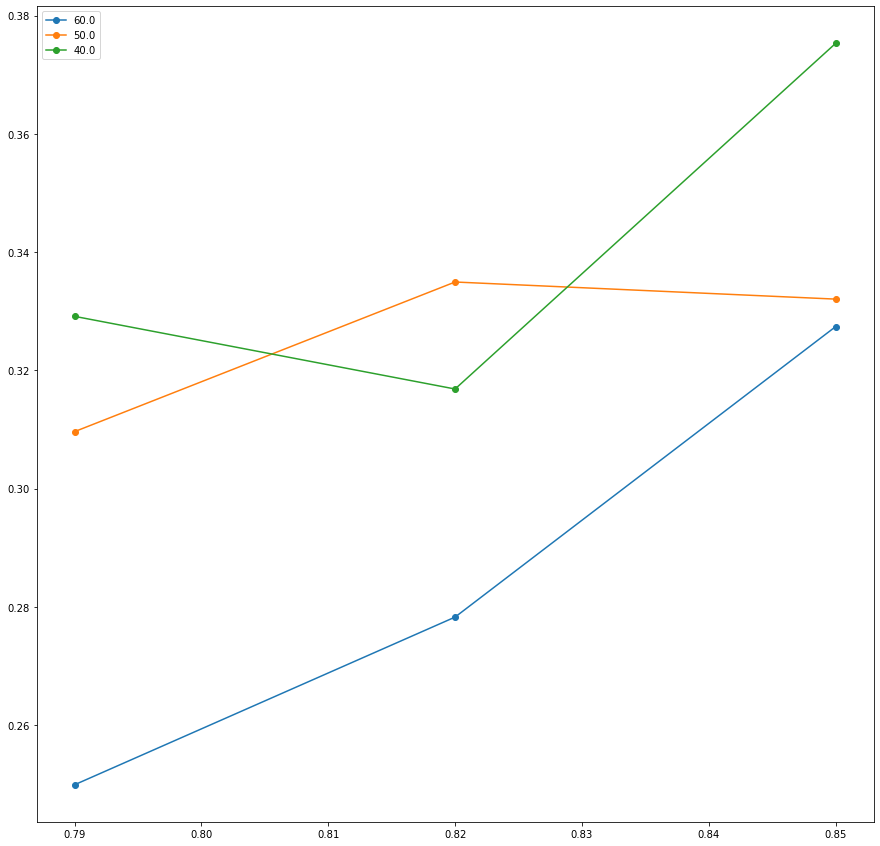

In [103]:
plt.figure(figsize=(15,15))
for x in range(0,len(ssim_list),3):
    
    plt.plot(distance_list,ssim_list[x:x+3],"-o")

plt.legend((1-percentage_list)*100)

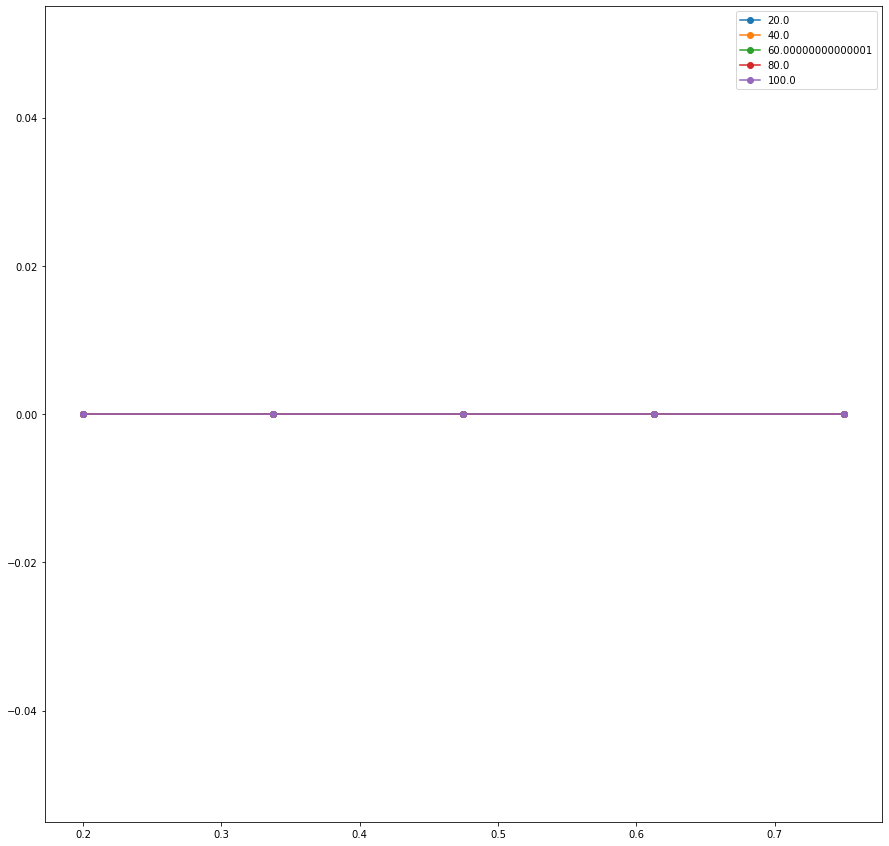

In [172]:
plt.figure(figsize=(15,15))
for x in range(0,len(hd_list),5):
    plt.plot(distance_list,hd_list[x:x+5],"-o")
plt.legend(percentage_list*100)

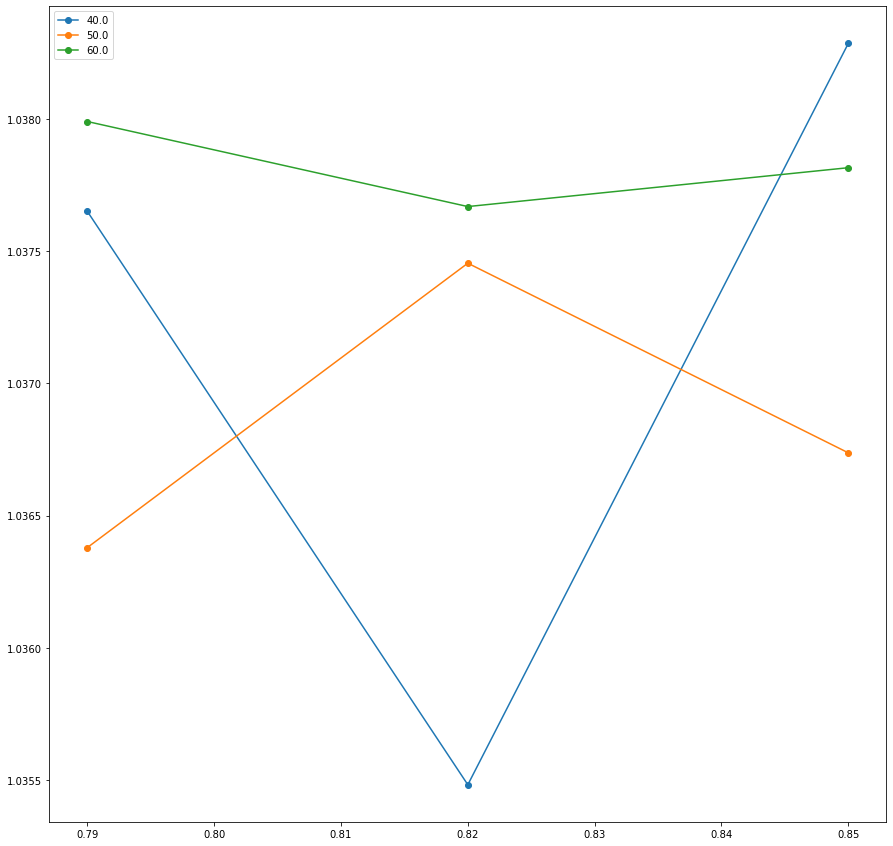

In [63]:
plt.figure(figsize=(15,15))
for x in range(0,len(nmi_list),3):
    plt.plot(distance_list,nmi_list[x:x+3],"-o")
plt.legend(percentage_list*100)

In [10]:
rotation_matrices = [np.eye(3)] * len(lst)  # Assuming the same rotation matrix for all images
translation_vectors = [np.array([df.iloc[i]["Pose_X"],df.iloc[i]["Pose_Y"],df.iloc[i]["Pose_Z"]]) for i in lst]  # Replace with actual translation vectors

def construct_extrinsic_matrix(rotation_matrix, translation_vector):
    extrinsic_matrix = np.hstack((rotation_matrix, translation_vector.reshape(-1, 1)))
    extrinsic_matrix = np.vstack((extrinsic_matrix, [0, 0, 0, 1]))
    return extrinsic_matrix

def align_images(images, extrinsic_matrices):
    aligned_images = []
    reference_matrix = np.eye(4)

    for i in range(len(images)):
        print("in")
        # Compute the relative transformation between the current image and the reference image
        relative_matrix = np.linalg.inv(extrinsic_matrices[i]) @ reference_matrix
        print(relative_matrix[:3, :])

        # Apply the relative transformation to the current image
        aligned_image = cv2.warpPerspective(images[i], relative_matrix[:3, :], (images[i].shape[1], images[i].shape[0]))

        aligned_images.append(aligned_image)

    return aligned_images

def stitch_images(images):
    # Create a stitcher object
    stitcher = cv2.Stitcher_create()

    # Set registration parameters if needed
    #stitcher.setRegistrationResol(0.6)
    #stitcher.setWaveCorrection(False)
    #stitcher.setFeaturesMatcher(cv2.detail_BestOf2NearestMatcher_create(False, 0.6))

    # Extract extrinsic matrices for each image
    extrinsic_matrices = [construct_extrinsic_matrix(rotation_matrix, translation_vector)
                          for rotation_matrix, translation_vector in zip(rotation_matrices, translation_vectors)]

    # Align images using extrinsic matrices
    aligned_images = align_images(images, extrinsic_matrices)

    # Stitch aligned images
    status, panorama = stitcher.stitch(aligned_images)

    if status == cv2.Stitcher_OK:
        plt.imshow("Panorama", panorama)
    else:
        print("Stitching failed")

# Example usage:
# Assume you have the following lists for each image



In [67]:


# Load images
images = [cv2.imread(img_path) for img_path in images_list]

# Stitch images
stitch_images(images)

in
[[1.00000000e+00 0.00000000e+00 0.00000000e+00 1.49997058e+00]
 [0.00000000e+00 1.00000000e+00 0.00000000e+00 1.02275409e-03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00 1.12533375e-12]]


error: OpenCV(4.2.0) ../modules/imgproc/src/imgwarp.cpp:3167: error: (-215:Assertion failed) (M0.type() == CV_32F || M0.type() == CV_64F) && M0.rows == 3 && M0.cols == 3 in function 'warpPerspective'


In [59]:
images

[array([[[145, 151, 127],
         [145, 151, 127],
         [145, 152, 126],
         ...,
         [146, 166, 149],
         [144, 166, 149],
         [144, 166, 149]],
 
        [[144, 151, 123],
         [145, 153, 124],
         [144, 148, 122],
         ...,
         [146, 166, 147],
         [144, 166, 149],
         [144, 166, 149]],
 
        [[132, 138, 107],
         [134, 140, 110],
         [138, 144, 113],
         ...,
         [146, 166, 147],
         [144, 166, 149],
         [144, 166, 149]],
 
        ...,
 
        [[159, 157, 121],
         [159, 157, 121],
         [156, 156, 122],
         ...,
         [158, 165, 130],
         [159, 166, 131],
         [158, 165, 130]],
 
        [[157, 158, 121],
         [157, 158, 121],
         [157, 157, 123],
         ...,
         [158, 165, 130],
         [159, 166, 131],
         [158, 165, 130]],
 
        [[160, 158, 122],
         [160, 158, 122],
         [158, 157, 125],
         ...,
         [160, 165, 130],
  

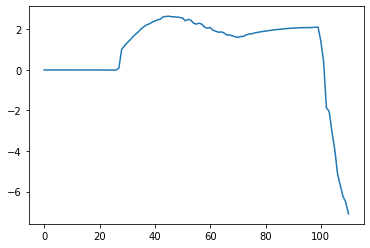

In [23]:
plt.plot(z_d)

0.1
[0, 48, 127, 181]
(720, 23, 3)
(720, 23, 3)
(720, 23, 3)


0.55
[0, 48, 127, 181]
(720, 127, 3)
(720, 127, 3)
(720, 127, 3)
1.0
[0, 48, 127, 181]
(720, 231, 3)
(720, 231, 3)
(720, 231, 3)
0.1
[0, 48, 127, 181]
(720, 13, 3)
(720, 13, 3)
(720, 13, 3)
0.55
[0, 48, 127, 181]
(720, 70, 3)
(720, 70, 3)
(720, 70, 3)
1.0
[0, 48, 127, 181]
(720, 127, 3)
(720, 127, 3)
(720, 127, 3)
0.1
[0, 48, 127, 181]
(720, 2, 3)
(720, 2, 3)
(720, 2, 3)
0.55
[0, 48, 127, 181]
(720, 13, 3)
(720, 13, 3)
(720, 13, 3)
1.0
[0, 48, 127, 181]
(720, 23, 3)
(720, 23, 3)
(720, 23, 3)


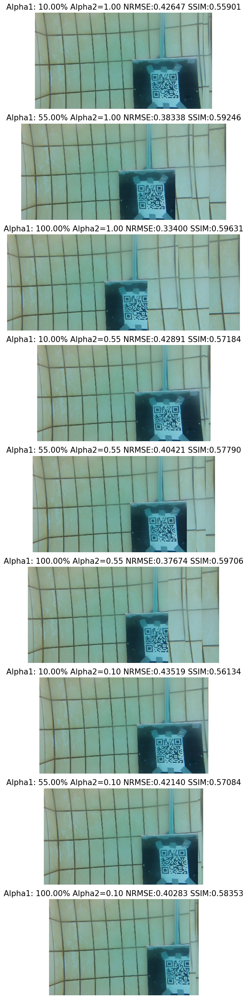

In [ ]:
j=6
alpha_list=np.linspace(1,0.1,3)
percentage_list=np.linspace(0.1,1,3)
os.makedirs("/home/uwr/Desktop/"+str(j)+"results_data_overlap/",exist_ok=True)
cv2.imwrite("/home/uwr/Desktop/"+str(j)+"_data/ref_image.png",image)
psnr_list=[]
ssim_list=[]
nrmse_list=[]
hd_list=[]
nmi_list=[]
img_list=[]

for alpha in alpha_list:
    for percentage in percentage_list:
        #print(distance,percentage)
        print(percentage)
        mosaic=image_mosaic_v3(min_dist=0.25,alpha1=percentage,alpha2=alpha)
        ssim,psnr,hd,nrmse,nmi=img_metrics(mosaic,image)
        psnr_list.append(psnr)
        ssim_list.append(ssim)
        hd_list.append(hd)
        nrmse_list.append(nrmse)
        nmi_list.append(nmi)
        img_list.append(mosaic)
        #percentage_list.append(percentage)
        #print(distance,percentage,nrmse)
        #cv2.imwrite("/home/abubakr/Desktop/"+str(j)+"results_data/"+str((1-percentage)*100)+"%"+str(distance)+"m_image.png",mosaic[100:400,:])
#print(nrmse_list)
num_images = len(img_list)
rows = int(np.ceil(num_images))  # Assuming you want 3 images per row

fig, axs = plt.subplots(rows,1, figsize=(12, rows*3 ))

for i in range(rows):
    for j in range(3):
        index = i * 3 + j
        #print(j)
        if index < num_images:
            axs[index].imshow(cv2.cvtColor(img_list[index],cv2.COLOR_BGR2RGB))
            axs[index].set_title(f"Alpha1: {(percentage_list[j])*100:.2f}% Alpha2={alpha_list[i]:.2f} NRMSE:{nrmse_list[index]:.5f} SSIM:{ssim_list[index]:.5f}",fontsize=15)
            
            axs[index].axis("off")

plt.subplots_adjust(wspace=0.0001, hspace=0.1)
plt.tight_layout()
plt.show()

[0, 21, 42, 55, 56, 77, 97, 98, 119, 143, 170, 185, 200, 212, 226]
(720, 384, 3)
(720, 896, 3)
(720, 384, 3)
(720, 896, 3)
(720, 384, 3)
(720, 896, 3)
(720, 384, 3)
(720, 896, 3)
(720, 384, 3)
(720, 896, 3)
(720, 384, 3)
(720, 896, 3)
(720, 384, 3)
(720, 896, 3)
(720, 384, 3)
(720, 896, 3)
(720, 384, 3)
(720, 896, 3)
(720, 384, 3)
(720, 896, 3)
(720, 384, 3)
(720, 896, 3)
(720, 384, 3)
(720, 896, 3)
(720, 384, 3)
(720, 896, 3)
(720, 384, 3)
(720, 896, 3)
[0, 55, 160]
(720, 384, 3)
(720, 896, 3)
(720, 384, 3)
(720, 896, 3)
[0, 97]
(720, 384, 3)
(720, 896, 3)
[0, 21, 42, 55, 56, 77, 97, 98, 119, 143, 170, 185, 200, 212, 226]
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720, 640, 3)
(720,

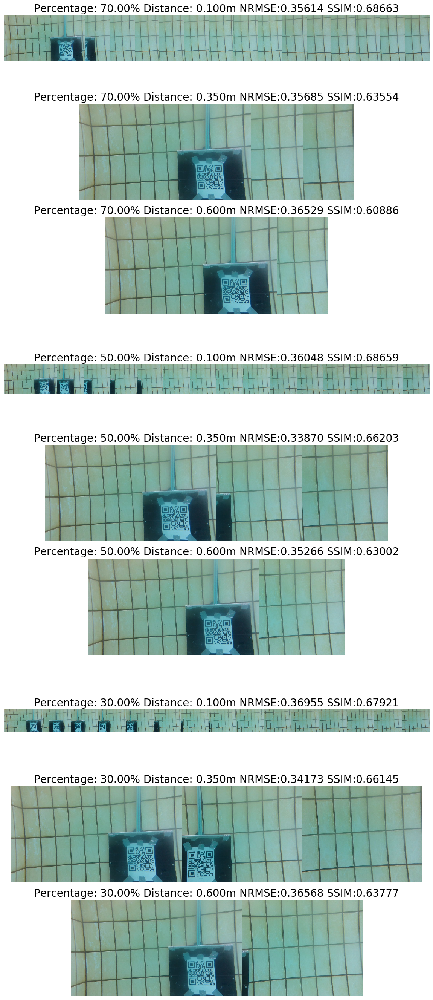

In [47]:
j=3101
percentage_list=np.linspace(0.7,0.3,3)
percentage_list
distance_list=np.linspace(0.1,0.6,3)
os.makedirs("/home/uwr/Desktop/"+str(j)+"results_data/",exist_ok=True)
cv2.imwrite("/home/uwr/Desktop/"+str(j)+"_data/ref_image.png",image)
psnr_list=[]
ssim_list=[]
nrmse_list=[]
hd_list=[]
nmi_list=[]
img_list=[]
for percentage in percentage_list:
    for distance in distance_list:
        #print(distance,percentage)
        mosaic=image_mosaic_v2(distance,percentage,alpha=0)
        ssim,psnr,hd,nrmse,nmi=img_metrics(image,mosaic)
        psnr_list.append(psnr)
        ssim_list.append(ssim)
        hd_list.append(hd)
        nrmse_list.append(nrmse)
        nmi_list.append(nmi)
        img_list.append(mosaic)
        #print(distance,percentage,nrmse)
        cv2.imwrite("/home/uwr/Desktop/"+str(j)+"results_data/"+str((1-percentage)*100)+"%"+str(distance)+"m_image.png",mosaic[100:400,:])
#print(nrmse_list)
num_images = len(img_list)
rows = int(np.ceil(num_images))  # Assuming you want 3 images per row

fig, axs = plt.subplots(rows,1, figsize=(12, rows*3 ))

for i in range(rows):
    for j in range(3):
        index = i * 3 + j
        #print(j)
        if index < num_images:
            axs[index].imshow(cv2.cvtColor(img_list[index],cv2.COLOR_BGR2RGB))
            axs[index].set_title(f"Percentage: {(percentage_list[i])*100:.2f}% Distance: {distance_list[j]:.3f}m NRMSE:{nrmse_list[index]:.5f} SSIM:{ssim_list[index]:.5f}",fontsize=20)
            
            axs[index].axis("off")

plt.subplots_adjust(wspace=0.0001, hspace=0.1)
plt.tight_layout()
plt.show()
